In [84]:
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision import datasets, transforms

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

from IPython.display import HTML

## Data loading

### Load the Fashion-MNIST Dataset

In [85]:
# Define the transformation
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0,), std=(1,))
])

# Set the root directory where the dataset will be stored
root = "dataset"

# Create a FashionMNIST dataset for training data
train_dataset = datasets.FashionMNIST(root=root, train=True, transform=transform, download=True)

# Create a DataLoader to load the dataset in batches
batch_size = 64  # You can adjust the batch size as needed
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True,drop_last=True)

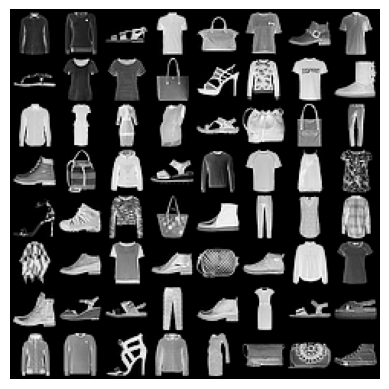

In [86]:
for batch in train_loader:
    images, labels = batch
    # Create a grid of images
    img_grid = make_grid(images, nrow=8)  # nrow is the number of images displayed in each row of the grid
    # Display the grid of images
    plt.imshow(img_grid[0].cpu().numpy(), cmap='gray')  # Assuming single-channel grayscale images
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()
    break  # Break the loop after the first batch to display one grid of images

## Models

In [87]:
class Generator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, output_dim),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.model(x)

# Discriminator model definition
class Discriminator(nn.Module):
    def __init__(self, input_dim):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.model(x)

In [88]:
# Initialize the models, criterion, and optimizers
z_dim = 100  # Dimension of the random noise vector
generator = Generator(input_dim=z_dim, output_dim=784)  # 28x28 = 784 for FashionMNIST
discriminator = Discriminator(input_dim=784)  # 28x28 = 784 for FashionMNIST
criterion = nn.BCELoss()  # Binary Cross Entropy Loss
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002)
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002)

# Training the Vanilla GAN
num_epochs = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator.to(device)
discriminator.to(device)
generator.train()
discriminator.train()

Discriminator(
  (model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=1, bias=True)
    (3): Sigmoid()
  )
)

# Training

In [89]:
def generate_and_save_images(generated_images, epoch, batch_size=16, save_path='gan_images'):
    fig, ax = plt.subplots(figsize=(4, 4))  # Set the figure size to control overall image size
    grid = torchvision.utils.make_grid(generated_images, nrow=4, normalize=True, pad_value=1)  # Set pad_value to 1 to remove padding
    ax.imshow(grid.permute(1, 2, 0), cmap='gray')
    ax.axis('off')
    plt.tight_layout(pad=0)  # Remove any extra padding
    plt.savefig(f'{save_path}/gan_epoch_{epoch:04d}.png', bbox_inches='tight', pad_inches=0)  # Save image without extra whitespace
    plt.close()


In [ ]:
for epoch in range(num_epochs):
    # Save generated images at the end of each epoch
    with torch.no_grad():
        z = torch.randn(16, z_dim).to(device)  # Generate random noise for 16 images
        generated_images = generator(z)
        generated_images = generated_images.view(-1, 1, 28, 28).cpu()
        generate_and_save_images(generated_images, epoch)
        generated_images=generated_images.numpy()
        fig, axes = plt.subplots(4, 4, figsize=(6, 6), sharex=True, sharey=True)
        for i, ax in enumerate(axes.flatten()):
            ax.imshow(generated_images[i][0], cmap='gray')
            ax.axis('off')
        plt.tight_layout()
        plt.show()
    for batch_idx, (real_images, _) in enumerate(train_loader):
        real_images = real_images.view(-1, 784).to(device)  # Flatten the images
        
        # Train Discriminator: maximize log(D(x)) + log(1 - D(G(z)))
        optimizer_D.zero_grad()
        z = torch.randn(batch_size, z_dim).to(device)  # Generate random noise
        fake_images = generator(z)
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)
        D_real = discriminator(real_images)
        D_fake = discriminator(fake_images.detach())  # Detach to avoid backpropagating through the generator
        loss_real = criterion(D_real, real_labels)
        loss_fake = criterion(D_fake, fake_labels)
        loss_D = loss_real + loss_fake
        loss_D.backward()
        optimizer_D.step()
        
        # Train Generator: maximize log(D(G(z)))
        optimizer_G.zero_grad()
        D_fake = discriminator(fake_images)
        loss_G = criterion(D_fake, real_labels)  # Generator wants to fool the discriminator
        loss_G.backward()
        optimizer_G.step()
        
        
    print(f"Epoch [{epoch}/{num_epochs}],  "
                  f"Loss D: {loss_D.item():.4f}, Loss G: {loss_G.item():.4f}")


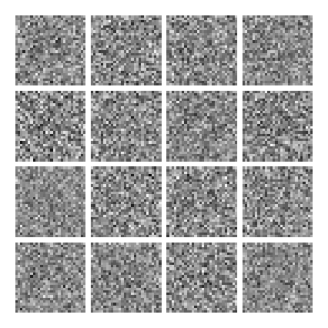

In [91]:
# Create an animation
fig = plt.figure(figsize=(4, 4))

def animate(i):
    img = plt.imread(f'gan_images/gan_epoch_{i:04d}.png')
    plt.imshow(img)
    plt.axis('off')

animation = FuncAnimation(fig, animate, frames=num_epochs, interval=200, repeat=False)
# animation.save('growingCoil.mp4', writer = 'ffmpeg', fps = 30) 
HTML(animation.to_jshtml())

# Save the Weights

In [10]:
torch.save(generator.state_dict(), "generator.pt")
torch.save(discriminator.state_dict(), "discriminator.pt")

In [23]:
z_dim=100
generator = Generator(input_dim=z_dim, output_dim=784)  # 28x28 = 784 for FashionMNIST
discriminator = Discriminator(input_dim=784)  # 28x28 = 784 for FashionMNIST

gen_weight = torch.load("generator.pt")
dis_weight = torch.load("discriminator.pt")

# Set the weights for the generator
generator.load_state_dict(gen_weight)
discriminator.load_state_dict(dis_weight)

<All keys matched successfully>